# Data Exploration and Baseline Calibration

## Import Packages

In [1]:
using Pkg; Pkg.activate("../"); Pkg.update(); Pkg.instantiate()
using MagNav
using Plots
gr()

 Activating environment at `~/magnav/MagNav.jl/Project.toml`
No Changes to `~/magnav/MagNav.jl/Project.toml`
No Changes to `~/magnav/MagNav.jl/Manifest.toml`


Plots.GRBackend()

## Get flight data

In [2]:
data_dir  = MagNav.data_dir()
data_file = string(data_dir,"/Flt1002-train.h5")
xyz_data  = get_flight_data(data_file);


> Reading in file: /home/gridsan/mokeeffe/.julia/artifacts/866ab128af87f731ff10fffb6017e6aa13b8da53/flight_data/Flt1002-train.h5


Check that the data loaded into a struct of type `XYZ` as defined in the `MagNav` module

In [3]:
typeof(xyz_data)

MagNav.XYZ

## Explore and visualize data

Take a look at the fields of the `XYZ` struct, either in `MagNav.jl` module or right in this notebook. 

In [4]:
fieldnames(MagNav.XYZ)

(:N, :DT, :LINE, :FLT, :TIME, :UTM_X, :UTM_Y, :UTM_Z, :MSL_Z, :LAT, :LONG, :BARO, :RADAR, :TOPO, :DEM, :DRAPE, :PITCH, :ROLL, :AZIMUTH, :DIURNAL, :COMPMAG1, :LAGMAG1, :DCMAG1, :IGRFMAG1, :UNCOMPMAG1, :UNCOMPMAG2, :UNCOMPMAG3, :UNCOMPMAG4, :UNCOMPMAG5, :FLUXB_X, :FLUXB_Y, :FLUXB_Z, :FLUXB_TOT, :FLUXC_X, :FLUXC_Y, :FLUXC_Z, :FLUXC_TOT, :FLUXD_X, :FLUXD_Y, :FLUXD_Z, :FLUXD_TOT, :OGS_MAG, :OGS_HGT, :INS_ACC_X, :INS_ACC_Y, :INS_ACC_Z, :INS_WANDER, :INS_LAT, :INS_LON, :INS_HGT, :INS_VEL_N, :INS_VEL_W, :INS_VEL_V, :PITCHRT, :ROLLRT, :YAWRT, :LONG_ACC, :LAT_ACC, :NORM_ACC, :TRUE_AS, :PITOT_P, :STATIC_P, :TOT_P, :CUR_COM1, :CUR_ACHi, :CUR_ACLo, :CUR_TANK, :CUR_FLAP, :CUR_STRB, :CUR_SRVO_O, :CUR_SRVO_M, :CUR_SRVO_I, :CUR_IHTR, :CUR_ACPWR, :CUR_OUTPWR, :CUR_BAT1, :CUR_BAT2, :V_ACPWR, :V_OUTPWR, :V_BAT1, :V_BAT2, :V_RESp, :V_RESn, :V_BACKp, :V_BACKn, :V_GYRO1, :V_GYRO2, :V_ACCp, :V_ACCn, :V_BLOCK, :V_BACK, :V_SERVO, :V_CABT, :V_FAN)

We can access the fields using the dot notation. For example, let's plot the raw (uncompensated) magnetometer data from a magnetometers 1, 3, and 5. 

In [5]:
plot(xyz_data.TIME, xyz_data.UNCOMPMAG1, label="Uncomp Mag 1",
    xlabel="Time [s]",ylabel="Magnetic Field [nT]")
plot!(xyz_data.TIME, xyz_data.UNCOMPMAG3, label="Uncomp Mag 3")
plot!(xyz_data.TIME, xyz_data.UNCOMPMAG5, label="Uncomp Mag 5")

Does this look messy? (Note: The first time we looked at this data, there were some lines that seemed to go back and forth. It turns out the data was sorted by flight line number, which are not sequential with time. Changing the `get_flight_data.jl` module fixed this problem. It's a good reminder that these steps tend to be iterative and you may have to jump back to an earlier step based on something you learn later.) The gaps in the data, for example between $5.52\times10^4$ s and $5.55\times10^4$ s, are held out for evaluation of the challenge problem. 

Let's look at the Calibration 1 portion of Flight 1002. The goal of these maneuvers is to maximize the aircraft field and minimize the earth field within a certain frequency band. The pilot accomplishes this by flying a box pattern with a series of roll, pitch, and yaw maneuvers on each leg. 

In [6]:
# define line numbers for Compensation 1 segment
i1         = findfirst(xyz_data.LINE .== 1002.02)
i2         = findlast( xyz_data.LINE .== 1002.02)
i1, i2

(12702, 25002)

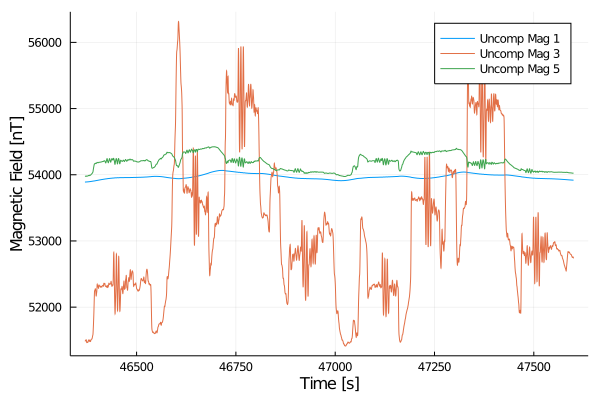

In [7]:
plot(xyz_data.TIME[i1:i2], xyz_data.UNCOMPMAG1[i1:i2], label="Uncomp Mag 1",
    xlabel="Time [s]",ylabel="Magnetic Field [nT]")
plot!(xyz_data.TIME[i1:i2], xyz_data.UNCOMPMAG3[i1:i2], label="Uncomp Mag 3")
plot!(xyz_data.TIME[i1:i2], xyz_data.UNCOMPMAG5[i1:i2], label="Uncomp Mag 5")

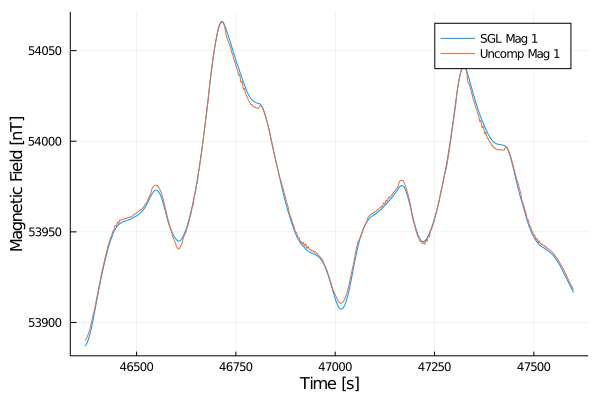

In [8]:
plot(xyz_data.TIME[i1:i2], xyz_data.COMPMAG1[i1:i2], label="SGL Mag 1", xlabel="Time [s]",ylabel="Magnetic Field [nT]")
plot!(xyz_data.TIME[i1:i2], xyz_data.UNCOMPMAG1[i1:i2], label="Uncomp Mag 1")
#plot!(xyz_data.TIME[i1:i2], xyz_data.UNCOMPMAG3[i1:i2], label="Uncomp Mag 3")
#plot!(xyz_data.TIME[i1:i2], xyz_data.UNCOMPMAG5[i1:i2], label="Uncomp Mag 5")

## Tolles-Lawson Calibration

In [9]:
## create Tolles-Lawson coefficients
pass1 = 0.1  # first  passband frequency [Hz]
pass2 = 0.9  # second passband frequency [Hz]
fs    = 10.0 # sampling frequency [Hz]
TL_coef_1  = create_TL_coef(xyz_data.FLUXB_X[i1:i2],
                            xyz_data.FLUXB_Y[i1:i2],
                            xyz_data.FLUXB_Z[i1:i2],
                            xyz_data.UNCOMPMAG1[i1:i2];
                            pass1=pass1,pass2=pass2,fs=fs)
TL_coef_3  = create_TL_coef(xyz_data.FLUXB_X[i1:i2],
                            xyz_data.FLUXB_Y[i1:i2],
                            xyz_data.FLUXB_Z[i1:i2],
                            xyz_data.UNCOMPMAG3[i1:i2];
                            pass1=pass1,pass2=pass2,fs=fs)
TL_coef_5  = create_TL_coef(xyz_data.FLUXB_X[i1:i2],
                            xyz_data.FLUXB_Y[i1:i2],
                            xyz_data.FLUXB_Z[i1:i2],
                            xyz_data.UNCOMPMAG5[i1:i2];
                            pass1=pass1,pass2=pass2,fs=fs)


18-element Array{Float64,1}:
  225.54852478899036
  337.18093501319566
  -76.21209485359904
  531.9068877598505
  195.69987383133972
 -277.7918811328047
  539.5741773548757
 -225.89452517942507
  923.2693315882606
 4469.90615640047
 1550.0247557993907
  694.9310104919863
 1541.3023848839166
 4652.44907979955
  329.0385717168061
  174.4669606726132
  188.06802329161735
 6513.136868487548

In [10]:
## create Tolles-Lawson A matrix
A = create_TL_A(xyz_data.FLUXB_X,
                xyz_data.FLUXB_Y,
                xyz_data.FLUXB_Z);

In [32]:
## calibrated magnetometer measurements
mag_1_c = xyz_data.UNCOMPMAG1 - A*TL_coef_1 .+ mean(A*TL_coef_1);
mag_3_c = xyz_data.UNCOMPMAG3 - A*TL_coef_3 .+ mean(A*TL_coef_3);
mag_5_c = xyz_data.UNCOMPMAG5 - A*TL_coef_5 .+ mean(A*TL_coef_5);

In [33]:
## correct for diurnal and core field variations
# IGRF offset
# calcIGRF = xyz_data.DCMAG1 - xyz_data.IGRFMAG1;
# mag_1_c = mag_1_c -xyz_data.DIURNAL-calcIGRF;
# mag_3_c = mag_3_c -xyz_data.DIURNAL-calcIGRF;
# mag_5_c = mag_5_c -xyz_data.DIURNAL-calcIGRF;

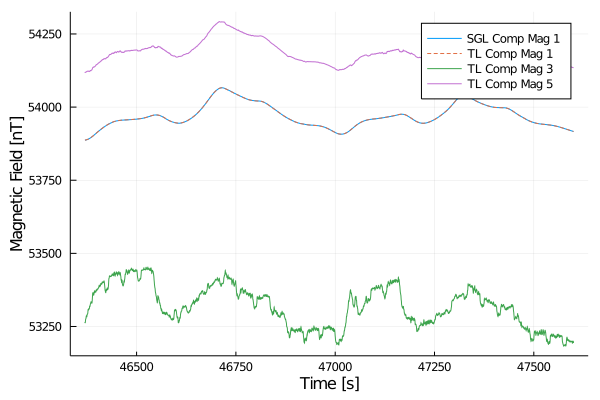

In [34]:
## plot total field comparison with SGL, Compensation 1 - No Detrend
plot(xyz_data.TIME[i1:i2], xyz_data.COMPMAG1[i1:i2], label="SGL Comp Mag 1", xlabel="Time [s]",ylabel="Magnetic Field [nT]")
plot!(xyz_data.TIME[i1:i2], mag_1_c[i1:i2], label="TL Comp Mag 1", linestyle=:dash)
plot!(xyz_data.TIME[i1:i2], mag_3_c[i1:i2], label="TL Comp Mag 3")
plot!(xyz_data.TIME[i1:i2], mag_5_c[i1:i2], label="TL Comp Mag 5")

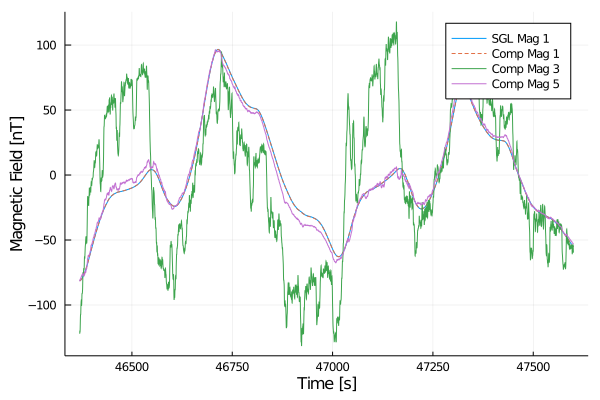

In [35]:
## plot total field comparison with SGL, Compensation 1
plot(xyz_data.TIME[i1:i2], detrend(xyz_data.COMPMAG1[i1:i2]), label="SGL Mag 1", xlabel="Time [s]", ylabel="Magnetic Field [nT]")
plot!(xyz_data.TIME[i1:i2], detrend(mag_1_c[i1:i2]), label="Comp Mag 1", linestyle=:dash)
plot!(xyz_data.TIME[i1:i2], detrend(mag_3_c[i1:i2]), label="Comp Mag 3")
plot!(xyz_data.TIME[i1:i2], detrend(mag_5_c[i1:i2]), label="Comp Mag 5")

In [36]:
size(xyz_data.TIME)

(207578,)

In [37]:
xyz_data.N

207578

In [38]:
using DelimitedFiles

In [39]:
writedlm("/home/gridsan/mokeeffe/magnav/preprocessed_data/mag_1_c.csv", mag_1_c)
writedlm("/home/gridsan/mokeeffe/magnav/preprocessed_data/mag_3_c.csv", mag_3_c)
writedlm("/home/gridsan/mokeeffe/magnav/preprocessed_data/mag_5_c.csv", mag_5_c)

## Big picture goals

Our goal is to remove the platform field contributions to match the truth values, either the map or magnetometer values after SGL's compensation. `Comp Mag 5` looks like a good place to start, `Comp Mag 3` looks like more of a challenge. 

## Further Exploration Ideas

1. Read the description of the dataset. Mark it up, highlight, question, note, try to play back what you're reading. 

2. Explore data by producting additional plots of the vector magnetometers. What can we learn through data exploration?

3. Learn your own Tolles-Lawson coefficients using the Compensation 2 segment. 